In [ ]:
!pip install transformers torch pandas scikit-learn mlflow matplotlib seaborn wordcloud tensorflow tensorflow-data-validation zenml tweepy cassandra-driver


In [154]:
import torch
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
import torch
from torch.utils.data import DataLoader, TensorDataset
from transformers import BertForSequenceClassification, BertTokenizer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import mlflow
import numpy as np
from transformers import BertForSequenceClassification, BertTokenizer
import torch
from torch.utils.data import DataLoader, TensorDataset
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import mlflow
import numpy as np
import os
import logging
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from transformers import BertTokenizer
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
import tensorflow_data_validation as tfdv
import mlflow
import mlflow.tensorflow
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from transformers import BertTokenizer, TFBertForSequenceClassification, BertConfig
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from zenml.steps import step
from zenml.pipelines import pipeline
import tweepy
import json
import requests
from cassandra.cluster import Cluster
from cassandra.auth import PlainTextAuthProvider
import uuid
import json
import pandas as pd
from sklearn.model_selection import train_test_split
import tensorflow as tf
import pandas as pd
import logging

In [155]:
# Constants and Hyperparameters
CSV_FILE_PATH = 'C:\\Users\\LENOVO\\Desktop\\CSC5356_SP24\\scripts\\dataset.csv'
PRETRAINED_LM_PATH = 'C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden'
HYPERPARAMS = {
    "batch_size": 16,
    "learning_rate": 2e-5,
    "epochs": 2,
    "weight_decay": 0.01,
    'max_grad_norm': 1.0,
    'lr_step_size': 1,
    'lr_gamma': 0.1,
    
}
print("Hyperparameters:", HYPERPARAMS)

Hyperparameters: {'batch_size': 16, 'learning_rate': 2e-05, 'epochs': 2, 'weight_decay': 0.01, 'max_grad_norm': 1.0, 'lr_step_size': 1, 'lr_gamma': 0.1}


In [156]:
data = pd.read_csv(CSV_FILE_PATH)

In [157]:
data.set_index('tweet_id', inplace = True)

In [158]:
data.head()

,text,label
tweet_id,,
1298098337946783745,"@USER @USER and like you, they are all squish #gop weasels who will be in tears on election night.",NONE
1296643755022397440,.@USER on covid-19: we'll put the politics aside. we'll take the muzzle off the experts so the the public gets the information they need and deserve. honest unvarnished truth. they can handle it. #demconvention @USER HTTP,FAVOR
1293907151501459462,"@USER google: how to vote early in ""your state"" and get it done as soon as possible. we have a duty to help the u.s. postal service process these ballots and reduce the stress donald trump is intentionally placing on these public servants. \n\n#voteearly #voteblue #bidenharris2020",FAVOR
1239356229803225088,am i the only one that pictures biden this way all the time? #demdebate HTTP,NONE
1298801129984266241,@USER was it the infanticide lie the nun dropped on us that was helpful?\n#rnc2020,NONE


In [159]:
if data.isnull().values.any():
            null_counts = data.isnull().sum()
            print("Warning: Null values found in the dataset.")
            print(f"Null value counts by column:\n{null_counts[null_counts > 0]}")

In [160]:
expected_columns = {'text','label'}

In [161]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20250 entries, 1298098337946783745 to 1292574112263610369
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   text    20250 non-null  object
 1   label   20250 non-null  object
dtypes: object(2)
memory usage: 474.6+ KB


In [162]:
data.isnull().sum()

text     0
label    0
dtype: int64

In [163]:
data.text.iloc[10]

'listened to both these guys for 2 hours tonight. much of what i heard is more big government that promises free/free/free, open borders, killing the oil industry and more. thanks, but we went through 8 years of that with obama and many of us do not want to go back.... #demdebate'

In [164]:
data.label.value_counts()

NONE       8478
FAVOR      6048
AGAINST    5724
Name: label, dtype: int64

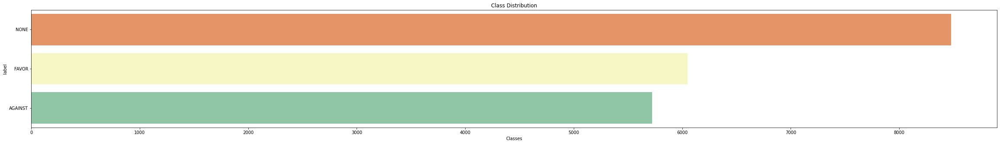

In [165]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(40, 5))
sns.countplot(data.label, palette='Spectral')
plt.xlabel('Classes')
plt.title('Class Distribution');

In [ ]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from zenml.steps import step, Output

@step
def data_analysis_step(CSV_FILE_PATH: str) -> Output(null_counts=pd.Series, class_distribution_fig=object):
    # Load the data
    data = pd.read_csv(CSV_FILE_PATH)
    data.set_index('tweet_id', inplace=True)

    # Display head of the dataframe
    print(data.head())

    # Check for null values
    if data.isnull().values.any():
        null_counts = data.isnull().sum()
        print("Warning: Null values found in the dataset.")
        print(f"Null value counts by column:\n{null_counts[null_counts > 0]}")

    # Display dataset info
    data.info()

    # Count nulls
    print(data.isnull().sum())

    # Access a specific element
    print(data.text.iloc[10])

    # Value counts for 'label'
    print(data.label.value_counts())

    # Plotting the class distribution
    plt.figure(figsize=(10, 5))
    sns.countplot(x=data.label, palette='Spectral')
    plt.xlabel('Classes')
    plt.title('Class Distribution')
    plt.show()

    # Return the null_counts and the figure (the figure as an example, handling of plt.figure in real applications may vary)
    return null_counts, plt.gcf()

# Note: In real deployment, you might want to handle outputs differently, such as saving them to files or databases.


In [166]:
def clean_text(text):
        """
        Function to clean text data.

        Args:
            text (str): Text to be cleaned.

        Returns:
            str: Cleaned text.
        """
        # Removing URLs
        text = re.sub(r'http\S+', '', text)
        # Removing usernames and hashtags
        text = re.sub(r'@\S+|#\S+', '', text)
        # Removing special characters and numbers
        text = re.sub(r'[^A-Za-z\s]', '', text)
        # Converting to lowercase
        text = text.lower().strip()
        # Tokenize and rejoin the text to ensure clean tokenization
        tokens = text.split()
        return ' '.join(tokens)

In [167]:
expected_columns = {'text','label'}
if not expected_columns.issubset(data.columns):
    missing_cols = expected_columns - set(data.columns)
    error_msg = f"The dataframe is missing the following required columns: {', '.join(missing_cols)}"
    logging.error(error_msg)
    raise ValueError(error_msg)

In [168]:
print("Preprocessing the data...")
missing_label_rows = data[data['label'].isna()]


Preprocessing the data...


In [169]:
data.dropna(subset=['label'], inplace=True)

In [128]:
if not missing_label_rows.empty:
    print(f"Rows with missing labels:\n{missing_label_rows}")
# If the DataFrame is empty after dropping missing values, return it as is
if data.empty:
    print("The DataFrame is empty after preprocessing.")

In [170]:
# Encode labels
label_mapping = {'NONE': 0, 'FAVOR': 1, 'AGAINST': 2}
data['label'] = data['label'].map(label_mapping)

In [171]:
data.head(15)

,text,label
tweet_id,,
1298098337946783745,"@USER @USER and like you, they are all squish #gop weasels who will be in tears on election night.",0
1296643755022397440,.@USER on covid-19: we'll put the politics aside. we'll take the muzzle off the experts so the the public gets the information they need and deserve. honest unvarnished truth. they can handle it. #demconvention @USER HTTP,1
1293907151501459462,"@USER google: how to vote early in ""your state"" and get it done as soon as possible. we have a duty to help the u.s. postal service process these ballots and reduce the stress donald trump is intentionally placing on these public servants. \n\n#voteearly #voteblue #bidenharris2020",1
1239356229803225088,am i the only one that pictures biden this way all the time? #demdebate HTTP,0
1298801129984266241,@USER was it the infanticide lie the nun dropped on us that was helpful?\n#rnc2020,0
1310982880865275907,@USER i think all the ‘lids’ on the biden campaign days is them trying to find the best drug cocktail to allow biden to look sentient. trial and error.,2
1302050245820506112,you know how they say anyone can be president? it's not true. trump tried it and he couldn't do it. he is literally unable to do the job. so maybe we should give it to someone else\n\n#trumpisaloser #biden2020,1
1239344169518116864,"biden is mostly campaigning for the general election, not debating bernie. #democraticdebate",0
1295022959787151360,so jazzed to get to meet future u.s.rep @USER &amp; u.s.sen. @USER at 11:30 today at stonebridge park in fayetteville. #2020election,0


In [172]:
# Validate the encoding
unique_labels = data['label'].unique()
if set(unique_labels) != {0, 1, 2}:
    error_msg = f"Labels are not correctly mapped. Found unique labels: {unique_labels}"
    logging.error(error_msg)
    raise ValueError(error_msg)

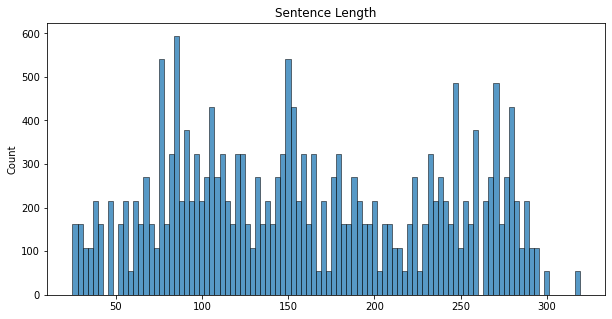

In [173]:
plt.figure(figsize=(10, 5))
sns.histplot([len(s) for s in data.text], bins=100)
plt.title('Sentence Length')
plt.show()

In [174]:
# Visualize Missing Values
missing_values = data.isnull().sum()
missing_percentage = (missing_values / len(data)) * 100
missing_df = pd.DataFrame({'Feature': missing_values.index, 'MissingValues': missing_values, 'Percentage': missing_percentage})
# Filter out features with no missing values
missing_df = missing_df[missing_df['MissingValues'] > 0].sort_values('Percentage', ascending=False)
# Plotting missing values (if there are any)
if not missing_df.empty:
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Percentage', y='Feature', data=missing_df)
    plt.title('Percentage of Missing Values per Feature')
    plt.xlabel('Percentage')
    plt.ylabel('Feature')
    plt.show()
else:
    print("No missing values found in the dataset.")


No missing values found in the dataset.


In [177]:
# Import necessary libraries
import re
import logging
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from zenml.steps import step, Output

@step
def preprocess_and_visualize_step(data: pd.DataFrame) -> Output(processed_data=pd.DataFrame, figures=list):
    """
    Step to preprocess and visualize data.

    Args:
        data (pd.DataFrame): Dataframe to be processed.

    Returns:
        pd.DataFrame: Processed data.
        list: List of matplotlib figure objects.
    """
    def clean_text(text):
        """
        Function to clean text data.
        """
        text = re.sub(r'http\S+', '', text)
        text = re.sub(r'@\S+|#\S+', '', text)
        text = re.sub(r'[^A-Za-z\s]', '', text)
        text = text.lower().strip()
        tokens = text.split()
        return ' '.join(tokens)

    expected_columns = {'text', 'label'}
    if not expected_columns.issubset(data.columns):
        missing_cols = expected_columns - set(data.columns)
        error_msg = f"The dataframe is missing the following required columns: {', '.join(missing_cols)}"
        logging.error(error_msg)
        raise ValueError(error_msg)

    print("Preprocessing the data...")
    # Apply the cleaning function to the text column
    data['text'] = data['text'].apply(clean_text)

    # Drop rows where 'label' is NaN
    data.dropna(subset=['label'], inplace=True)

    # Encode labels
    label_mapping = {'NONE': 0, 'FAVOR': 1, 'AGAINST': 2}
    data['label'] = data['label'].map(label_mapping)

    # Validate the encoding
    unique_labels = data['label'].unique()
    if set(unique_labels) != {0, 1, 2}:
        error_msg = f"Labels are not correctly mapped. Found unique labels: {unique_labels}"
        logging.error(error_msg)
        raise ValueError(error_msg)

    # Visualization of sentence length
    fig1 = plt.figure(figsize=(10, 5))
    sns.histplot([len(s) for s in data['text']], bins=100)
    plt.title('Sentence Length')
    plt.show()

    # Visualization of Missing Values
    missing_values = data.isnull().sum()
    missing_percentage = (missing_values / len(data)) * 100
    missing_df = pd.DataFrame({'Feature': missing_values.index, 'MissingValues': missing_values, 'Percentage': missing_percentage})
    missing_df = missing_df[missing_df['MissingValues'] > 0].sort_values('Percentage', ascending=False)

    if not missing_df.empty:
        fig2 = plt.figure(figsize=(10, 6))
        sns.barplot(x='Percentage', y='Feature', data=missing_df)
        plt.title('Percentage of Missing Values per Feature')
        plt.xlabel('Percentage')
        plt.ylabel('Feature')
        plt.show()
    else:
        print("No missing values found in the dataset.")
    
    return data, [fig1, fig2] if not missing_df.empty else [fig1]

# This setup assumes logging is configured elsewhere in your application.


The @step decorator that you used to define your preprocess_and_visualize_step step is deprecated. Check out the 0.40.0 migration guide for more information on how to migrate your steps to the new syntax: https://docs.zenml.io/reference/migration-guide/migration-zero-forty
Using the Output class to define the outputs of your steps is deprecated. You should instead use the standard Python way of type annotating your functions. Check out our documentation https://docs.zenml.io/user-guide/advanced-guide/pipelining-features/configure-steps-pipelines#step-output-names for more information on how to assign custom names to your step outputs.


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


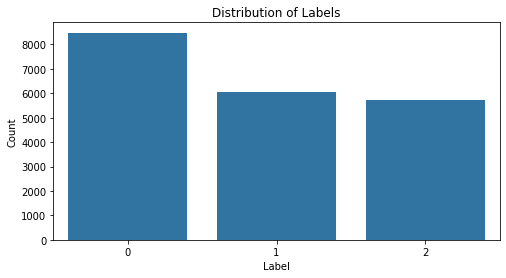

In [178]:
# Data Distribution Visualization
if 'label' in data.columns:
    plt.figure(figsize=(8, 4))
    sns.countplot(x='label', data=data)
    plt.title('Distribution of Labels')
    plt.xlabel('Label')
    plt.ylabel('Count')
    plt.show()
else:
    print("Label column not found, skipping label distribution visualization.")

In [179]:
# Define the size for your test and validation sets
test_size = 0.2
validation_size = 0.1

# Initial split to separate out the test set
train_val_data, test_data = train_test_split(data, test_size=test_size, random_state=42)

# Calculate the adjusted validation size based on the remaining data after test split
adjusted_validation_size = validation_size / (1 - test_size)

# Split the remaining data into training and validation sets
train_data, val_data = train_test_split(train_val_data, test_size=adjusted_validation_size, random_state=42)

In [180]:
train_stats = tfdv.generate_statistics_from_dataframe(train_data)

In [181]:
tfdv.visualize_statistics(train_stats)

In [182]:
val_stats = tfdv.generate_statistics_from_dataframe(val_data)

In [183]:
tfdv.visualize_statistics(val_stats)

In [184]:
test_stats = tfdv.generate_statistics_from_dataframe(test_data)

In [185]:
tfdv.visualize_statistics(test_stats)

In [186]:
# Infer schema from training data
schema = tfdv.infer_schema(statistics=train_stats)
print("Schema inferred from the testing data.")

Schema inferred from the testing data.


In [187]:
tfdv.display_schema(schema=schema)

,Type,Presence,Valency,Domain
Feature name,,,,
'text',BYTES,required,,-
'label',INT,required,,-
'tweet_id',INT,required,,-


In [188]:
for dataset_name, dataset_stats in [('Validation', val_stats), ('Test', test_stats)]:
    print(f"Validating {dataset_name} data...")
    anomalies = tfdv.validate_statistics(statistics=dataset_stats, schema=schema)
    if anomalies.anomaly_info:
        print(f"Anomalies found in {dataset_name} data:")
        tfdv.display_anomalies(anomalies)
    else:
        print(f"No anomalies detected in {dataset_name} data.")

Validating Validation data...
No anomalies detected in Validation data.
Validating Test data...
No anomalies detected in Test data.


In [189]:
anomalies = tfdv.validate_statistics(statistics=train_stats, schema=schema)
tfdv.display_anomalies(anomalies)


In [ ]:
# Import necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow_data_validation as tfdv
from zenml.steps import step, Output

@step
def split_and_validate_data_step(data: pd.DataFrame) -> Output(train_data=pd.DataFrame, val_data=pd.DataFrame, test_data=pd.DataFrame, schema=object):
    """
    Step to split the data into training, validation, and test sets and validate them.

    Args:
        data (pd.DataFrame): The full dataset.

    Returns:
        pd.DataFrame: Training data.
        pd.DataFrame: Validation data.
        pd.DataFrame: Test data.
        object: TFDV schema object.
    """
    # Data Distribution Visualization
    if 'label' in data.columns:
        plt.figure(figsize=(8, 4))
        sns.countplot(x='label', data=data)
        plt.title('Distribution of Labels')
        plt.xlabel('Label')
        plt.ylabel('Count')
        plt.show()
    else:
        print("Label column not found, skipping label distribution visualization.")

    # Define the size for your test and validation sets
    test_size = 0.2
    validation_size = 0.1

    # Initial split to separate out the test set
    train_val_data, test_data = train_test_split(data, test_size=test_size, random_state=42)

    # Calculate the adjusted validation size based on the remaining data after test split
    adjusted_validation_size = validation_size / (1 - test_size)

    # Split the remaining data into training and validation sets
    train_data, val_data = train_test_split(train_val_data, test_size=adjusted_validation_size, random_state=42)

    # Generate statistics and infer schema
    train_stats = tfdv.generate_statistics_from_dataframe(train_data)
    val_stats = tfdv.generate_statistics_from_dataframe(val_data)
    test_stats = tfdv.generate_statistics_from_dataframe(test_data)
    schema = tfdv.infer_schema(statistics=train_stats)
    print("Schema inferred from the training data.")
    tfdv.display_schema(schema=schema)

    # Validate statistics against the schema
    for dataset_name, dataset_stats in [('Validation', val_stats), ('Test', test_stats)]:
        print(f"Validating {dataset_name} data...")
        anomalies = tfdv.validate_statistics(statistics=dataset_stats, schema=schema)
        if anomalies.anomaly_info:
            print(f"Anomalies found in {dataset_name} data:")
            tfdv.display_anomalies(anomalies)
        else:
            print(f"No anomalies detected in {dataset_name} data.")

    # Also validate training data
    anomalies = tfdv.validate_statistics(statistics=train_stats, schema=schema)
    tfdv.display_anomalies(anomalies)

    return train_data, val_data, test_data, schema

# Ensure tensorflow_data_validation is installed in your environment.


In [190]:
# Initialize the tokenizer
tokenizer = BertTokenizer.from_pretrained(PRETRAINED_LM_PATH)
from cassandra.policies import DCAwareRoundRobinPolicy

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [191]:
print("Connecting to the Cassandra Database...")
cluster = Cluster(contact_points=['127.0.0.1'],port=9042,load_balancing_policy=DCAwareRoundRobinPolicy())
session = cluster.connect()
session.set_keyspace('keyspace')

Connecting to the Cassandra Database...
Downgrading core protocol version from 66 to 65 for 127.0.0.1:9042. To avoid this, it is best practice to explicitly set Cluster(protocol_version) to the version supported by your cluster. http://datastax.github.io/python-driver/api/cassandra/cluster.html#cassandra.cluster.Cluster.protocol_version
Downgrading core protocol version from 65 to 5 for 127.0.0.1:9042. To avoid this, it is best practice to explicitly set Cluster(protocol_version) to the version supported by your cluster. http://datastax.github.io/python-driver/api/cassandra/cluster.html#cassandra.cluster.Cluster.protocol_version
Using datacenter 'datacenter1' for DCAwareRoundRobinPolicy (via host '127.0.0.1:9042'); if incorrect, please specify a local_dc to the constructor, or limit contact points to local cluster nodes


In [192]:
import warnings
warnings.filterwarnings('ignore')
from transformers import BertTokenizer
from cassandra.cluster import Cluster
from cassandra.query import BatchStatement
from cassandra import ConsistencyLevel
import uuid
import pandas as pd
import logging

In [193]:
print(data.columns)

Index(['text', 'label'], dtype='object')


In [194]:
data.head()

,text,label
tweet_id,,
1298098337946783745,"@USER @USER and like you, they are all squish #gop weasels who will be in tears on election night.",0
1296643755022397440,.@USER on covid-19: we'll put the politics aside. we'll take the muzzle off the experts so the the public gets the information they need and deserve. honest unvarnished truth. they can handle it. #demconvention @USER HTTP,1
1293907151501459462,"@USER google: how to vote early in ""your state"" and get it done as soon as possible. we have a duty to help the u.s. postal service process these ballots and reduce the stress donald trump is intentionally placing on these public servants. \n\n#voteearly #voteblue #bidenharris2020",1
1239356229803225088,am i the only one that pictures biden this way all the time? #demdebate HTTP,0
1298801129984266241,@USER was it the infanticide lie the nun dropped on us that was helpful?\n#rnc2020,0


In [52]:

insert_statement = session.prepare('INSERT INTO "keyspace".features (id, features) VALUES (?, ?)')
batch = BatchStatement(consistency_level=ConsistencyLevel.ONE)
batch_size_limit = 16
if 'tokens' not in data.columns:
    data['tokens'] = None

for index, row in data.iterrows():
    row_id = uuid.uuid4()
    tokens = tokenizer.encode(row['text'], add_special_tokens=True)
    data.at[index, 'tokens'] = tokens
    batch.add(insert_statement, (row_id, tokens))

    if len(batch) >= batch_size_limit:
        session.execute(batch)
        batch.clear()

if len(batch) > 0:
    session.execute(batch)

    print("Feature engineering and data insertion completed successfully.")

Error preparing query:
Traceback (most recent call last):
  File "cassandra\cluster.py", line 3128, in cassandra.cluster.Session.prepare
  File "cassandra\cluster.py", line 4956, in cassandra.cluster.ResponseFuture.result
cassandra.InvalidRequest: Error from server: code=2200 [Invalid query] message="Undefined column name features in table "keyspace".features"


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:1                                                                                    │
│                                                                                                  │
│ in cassandra.cluster.Session.prepare:3131                                                        │
│                                                                                                  │
│ in cassandra.cluster.Session.prepare:3128                                                        │
│                                                                                                  │
│ in cassandra.cluster.ResponseFuture.result:4956                                                  │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
InvalidRequest: Error from server: code=2200 [Invalid query] message="Undefined column name features in table 
"keyspace".features"

In [58]:

# Preparing the insert statement to include positional information
#DESCRIBE TABLE "keyspace".features;
def clean_text(text):
    # Implement text cleaning here
    text = text.replace('@USER', '')  # Remove @USER mentions
    text = re.sub(r'http\S+', '', text)  # Remove URLs
    text = text.lower()  # Convert to lowercase
    # Add other cleaning steps as needed
    return text
# Function for text normalization
def normalize_text(text):
    # Implement text normalization steps here
    # For example: lowercasing, handling mentions, hashtags, URLs
    normalized_text = text.lower()
    # Add more normalization steps as required
    return normalized_text
insert_statement = session.prepare(
    'INSERT INTO "keyspace".features (id, tokens, label) VALUES (?, ?, ?)'
)

In [195]:
batch = BatchStatement(consistency_level=ConsistencyLevel.ONE)
batch_size_limit = 16

if 'tokens' not in data.columns:
    data['tokens'] = None

for index, row in data.iterrows():
    row_id = uuid.uuid4()

    # Ensure tokens are correctly formatted as a list of integers
    tokens = tokenizer.encode(row['text'], add_special_tokens=True)
    if not all(isinstance(token, int) for token in tokens):
        # Handle the case where tokens are not all integers
        # This might involve converting or handling errors
        pass

    label = str(row['label'])  # Ensure label is a string

    batch.add(insert_statement, (row_id, tokens, label))

    if len(batch) >= batch_size_limit:
        session.execute(batch)
        batch.clear()

if len(batch) > 0:
    session.execute(batch)

print("Feature engineering and data insertion completed successfully.")


Server warning: Batch for ["keyspace".features] is of size 27040, exceeding specified threshold of 5120 by 21920.
Server warning: Batch for ["keyspace".features] is of size 24340, exceeding specified threshold of 5120 by 19220.
Server warning: Batch for ["keyspace".features] is of size 26140, exceeding specified threshold of 5120 by 21020.
Server warning: Batch for ["keyspace".features] is of size 28444, exceeding specified threshold of 5120 by 23324.
Server warning: Batch for ["keyspace".features] is of size 29164, exceeding specified threshold of 5120 by 24044.
Server warning: Batch for ["keyspace".features] is of size 26860, exceeding specified threshold of 5120 by 21740.
Server warning: Batch for ["keyspace".features] is of size 21784, exceeding specified threshold of 5120 by 16664.
Server warning: Batch for ["keyspace".features] is of size 25744, exceeding specified threshold of 5120 by 20624.
Server warning: Batch for ["keyspace".features] is of size 27292, exceeding specified th

In [196]:
# Fetch all table names in the keyspace
rows = session.execute("SELECT table_name FROM system_schema.tables WHERE keyspace_name = %s", ["keyspace"])
table_names = [row[0] for row in rows]

for table_name in table_names:
    print(f"Contents of table {table_name}:")
    rows = session.execute(f"SELECT * FROM {table_name}")
    for row in rows:
        print(row)
    print("\n")

Contents of table features:
Row(id=UUID('f19e7b7b-6a74-482b-af1a-40b87405cf6d'), label='1', tokens=[101, 1001, 100, 3422, 2054, 3047, 2012, 1014, 1024, 2459, 1999, 1030, 5310, 1005, 1055, 3743, 1024, 4729, 23521, 2050, 1523, 2304, 28283, 24413, 14303, 16341, 1524, 1001, 21911, 23278, 18752, 2015, 1001, 3533, 17062, 2368, 8299, 102])
Row(id=UUID('eee9ce3e-abaa-4461-990e-66b9db7c59c4'), label='0', tokens=[101, 1030, 5310, 1030, 5310, 1030, 5310, 1045, 1521, 1049, 2025, 1037, 2502, 7226, 2368, 5470, 1010, 2021, 1045, 1521, 1049, 2214, 2438, 2000, 3342, 2043, 16233, 1004, 23713, 1025, 12667, 2499, 2362, 1010, 2000, 2830, 1996, 2406, 1012, 1996, 2088, 9768, 2149, 1012, 8398, 2038, 4055, 2149, 9249, 1004, 23713, 1025, 1996, 2088, 2085, 2119, 11839, 2015, 2005, 2149, 1004, 23713, 1025, 2003, 4487, 12693, 6129, 2993, 2013, 2149, 1010, 10317, 1004, 23713, 1025, 6719, 1012, 8398, 2003, 2053, 2204, 1030, 2023, 1012, 8299, 102])
Row(id=UUID('14f3bb16-b4d4-4014-9543-80839b1aca5c'), label='1', token

In [ ]:
#SELECT * FROM "keyspace".features LIMIT 10;
#SELECT COUNT(*) FROM "keyspace".features;


In [ ]:
# Import necessary libraries
from transformers import BertTokenizer
from cassandra.cluster import Cluster
from cassandra.policies import DCAwareRoundRobinPolicy
from cassandra.query import BatchStatement
from cassandra import ConsistencyLevel
import uuid
import re
import pandas as pd
import logging
from zenml.steps import step, Output

@step
def tokenize_and_insert_data_step(data: pd.DataFrame, PRETRAINED_LM_PATH: str) -> Output(insertion_success=bool):
    """
    Step to tokenize text data and insert into Cassandra database.

    Args:
        data (pd.DataFrame): The dataframe containing text data.
        PRETRAINED_LM_PATH (str): Path to the pretrained language model for tokenization.

    Returns:
        bool: True if data insertion was successful, False otherwise.
    """
    # Initialize the tokenizer
    tokenizer = BertTokenizer.from_pretrained(PRETRAINED_LM_PATH)

    # Connect to the Cassandra Database
    print("Connecting to the Cassandra Database...")
    cluster = Cluster(contact_points=['127.0.0.1'], port=9042, load_balancing_policy=DCAwareRoundRobinPolicy())
    session = cluster.connect()
    session.set_keyspace('keyspace')

    # Preparing the insert statement
    insert_statement = session.prepare(
        'INSERT INTO "keyspace".features (id, tokens, label) VALUES (?, ?, ?)'
    )
    batch = BatchStatement(consistency_level=ConsistencyLevel.ONE)
    batch_size_limit = 16

    # Tokenization and data insertion
    try:
        for index, row in data.iterrows():
            row_id = uuid.uuid4()
            tokens = tokenizer.encode(row['text'], add_special_tokens=True)
            label = str(row['label'])
            batch.add(insert_statement, (row_id, tokens, label))

            if len(batch) >= batch_size_limit:
                session.execute(batch)
                batch.clear()

        if len(batch) > 0:
            session.execute(batch)
        
        # Display success message
        print("Feature engineering and data insertion completed successfully.")
        return True
    except Exception as e:
        logging.error(f"An error occurred during data insertion: {e}")
        return False
    finally:
        session.shutdown()

# Ensure that the necessary Python libraries are installed in your environment.


In [198]:
from cassandra.cluster import Cluster
import pandas as pd

print("Connecting to the Cassandra Database...")
cluster = Cluster(contact_points=['127.0.0.1'], port=9042)
session = cluster.connect()
session.set_keyspace('keyspace')

# Query to retrieve data from Cassandra
query = "SELECT id, tokens, label FROM features;"
rows = session.execute(query)

# Convert the data to a Pandas DataFrame
data = pd.DataFrame(list(rows))

# Assuming 'tokens' are your features and 'label' is the target variable
# Format data for training
X = data['tokens'].tolist()  # Feature set
y = data['label'].tolist()   # Labels

# At this point, X and y can be used in a machine learning model training process.
# Example: Using these in a PyTorch or TensorFlow training pipeline.

print("Data loading completed successfully.")


Connecting to the Cassandra Database...
Cluster.__init__ called with contact_points specified, but no load_balancing_policy. In the next major version, this will raise an error; please specify a load-balancing policy. (contact_points = ['127.0.0.1'], lbp = None)
Downgrading core protocol version from 66 to 65 for 127.0.0.1:9042. To avoid this, it is best practice to explicitly set Cluster(protocol_version) to the version supported by your cluster. http://datastax.github.io/python-driver/api/cassandra/cluster.html#cassandra.cluster.Cluster.protocol_version
Downgrading core protocol version from 65 to 5 for 127.0.0.1:9042. To avoid this, it is best practice to explicitly set Cluster(protocol_version) to the version supported by your cluster. http://datastax.github.io/python-driver/api/cassandra/cluster.html#cassandra.cluster.Cluster.protocol_version
Using datacenter 'datacenter1' for DCAwareRoundRobinPolicy (via host '127.0.0.1:9042'); if incorrect, please specify a local_dc to the const

In [199]:
print(X)

[[101, 1001, 100, 3422, 2054, 3047, 2012, 1014, 1024, 2459, 1999, 1030, 5310, 1005, 1055, 3743, 1024, 4729, 23521, 2050, 1523, 2304, 28283, 24413, 14303, 16341, 1524, 1001, 21911, 23278, 18752, 2015, 1001, 3533, 17062, 2368, 8299, 102], [101, 1030, 5310, 1030, 5310, 1030, 5310, 1045, 1521, 1049, 2025, 1037, 2502, 7226, 2368, 5470, 1010, 2021, 1045, 1521, 1049, 2214, 2438, 2000, 3342, 2043, 16233, 1004, 23713, 1025, 12667, 2499, 2362, 1010, 2000, 2830, 1996, 2406, 1012, 1996, 2088, 9768, 2149, 1012, 8398, 2038, 4055, 2149, 9249, 1004, 23713, 1025, 1996, 2088, 2085, 2119, 11839, 2015, 2005, 2149, 1004, 23713, 1025, 2003, 4487, 12693, 6129, 2993, 2013, 2149, 1010, 10317, 1004, 23713, 1025, 6719, 1012, 8398, 2003, 2053, 2204, 1030, 2023, 1012, 8299, 102], [101, 1030, 5310, 1030, 5310, 1030, 5310, 1030, 5310, 1030, 5310, 2017, 2024, 2019, 7780, 2000, 2035, 1010, 2926, 2308, 2040, 2954, 10126, 2007, 2061, 2116, 2367, 15314, 999, 4067, 2017, 100, 1001, 17183, 8663, 15338, 3258, 1001, 7226, 23

In [200]:
print(y)

['1', '0', '1', '0', '0', '1', '1', '2', '0', '1', '2', '2', '2', '1', '0', '0', '0', '1', '1', '2', '1', '0', '0', '1', '2', '1', '2', '2', '0', '1', '2', '0', '0', '2', '1', '1', '2', '1', '2', '2', '1', '0', '1', '0', '0', '2', '1', '1', '2', '2', '2', '0', '2', '1', '1', '2', '0', '2', '0', '1', '1', '0', '0', '0', '0', '0', '0', '1', '1', '1', '2', '1', '0', '0', '1', '0', '0', '2', '0', '0', '1', '0', '2', '2', '2', '1', '0', '1', '0', '0', '1', '1', '0', '0', '0', '2', '0', '2', '2', '0', '2', '1', '0', '2', '1', '2', '2', '2', '0', '2', '0', '1', '0', '2', '2', '1', '1', '0', '2', '1', '1', '0', '2', '2', '2', '1', '0', '2', '0', '1', '1', '2', '2', '1', '1', '2', '1', '1', '1', '0', '0', '2', '0', '1', '0', '0', '1', '0', '2', '1', '1', '1', '2', '0', '0', '0', '2', '2', '2', '1', '0', '0', '1', '2', '2', '2', '0', '2', '2', '1', '1', '2', '1', '2', '1', '2', '2', '1', '1', '1', '0', '1', '0', '0', '0', '2', '1', '2', '2', '2', '0', '0', '1', '0', '2', '0', '1', '0', '2', '1',

In [201]:
from sklearn.model_selection import train_test_split

# Assuming you have already loaded your data into X (features) and y (labels)

# Splitting the dataset into training and temporary sets (combining validation and test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)

# Further splitting the temporary set into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Training set size: {len(X_train)}")
print(f"Validation set size: {len(X_val)}")
print(f"Test set size: {len(X_test)}")

# Now, X_train, y_train are your training data
# X_val, y_val are your validation data
# X_test, y_test are your test data

# You can proceed with using these datasets for training and evaluating your model.


Training set size: 12825
Validation set size: 4275
Test set size: 4275


In [ ]:
# Import necessary libraries
from cassandra.cluster import Cluster
import pandas as pd
from sklearn.model_selection import train_test_split
from zenml.steps import step, Output

@step
def load_and_split_data_step() -> Output(X_train=list, X_val=list, X_test=list, y_train=list, y_val=list, y_test=list):
    """
    Step to load data from a Cassandra database, convert it to a suitable format, and split into training, validation, and test sets.

    Returns:
        list: Training features.
        list: Validation features.
        list: Test features.
        list: Training labels.
        list: Validation labels.
        list: Test labels.
    """
    print("Connecting to the Cassandra Database...")
    cluster = Cluster(contact_points=['127.0.0.1'], port=9042)
    session = cluster.connect()
    session.set_keyspace('keyspace')

    # Query to retrieve data
    query = "SELECT id, tokens, label FROM features;"
    rows = session.execute(query)

    # Convert the data to a Pandas DataFrame
    data = pd.DataFrame(list(rows))

    # Assuming 'tokens' are features and 'label' is the target
    X = data['tokens'].tolist()  # Feature set
    y = data['label'].tolist()   # Labels

    print("Data loading completed successfully.")

    # Splitting the dataset into training and temporary sets (combining validation and test)
    X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)

    # Further splitting the temporary set into validation and test sets
    X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

    print(f"Training set size: {len(X_train)}")
    print(f"Validation set size: {len(X_val)}")
    print(f"Test set size: {len(X_test)}")

    return X_train, X_val, X_test, y_train, y_val, y_test

# Note: Ensure Cassandra driver is installed and correctly configured in your environment.


In [202]:
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
import torch
from torch.utils.data import DataLoader, TensorDataset, random_split
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

# Initialize the BERT tokenizer
tokenizer = BertTokenizer.from_pretrained('C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden')

# Encoding labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# BERT Input Formatting
input_ids = []
attention_masks = []

for sent in X:
    encoded_dict = tokenizer.encode_plus(
                        sent,                      # Sentence to encode
                        add_special_tokens = True, # Add '[CLS]' and '[SEP]'
                        max_length = 64,           # Pad & truncate all sentences
                        pad_to_max_length = True,
                        return_attention_mask = True,   # Construct attn. masks
                        return_tensors = 'pt',     # Return pytorch tensors
                   )
    
    # Add the encoded sentence to the list
    input_ids.append(encoded_dict['input_ids'])
    
    # And its attention mask (simply differentiates padding from non-padding)
    attention_masks.append(encoded_dict['attention_mask'])

# Convert the lists into tensors
input_ids = torch.cat(input_ids, dim=0)
attention_masks = torch.cat(attention_masks, dim=0)
labels = torch.tensor(y_encoded)

# Use train_test_split to split our data into train and validation sets
train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, random_state=2018, test_size=0.1)
train_masks, validation_masks, _, _ = train_test_split(attention_masks, labels, random_state=2018, test_size=0.1)

# Create the DataLoader for our training set
train_data = TensorDataset(train_inputs, train_masks, train_labels)
train_sampler = torch.utils.data.RandomSampler(train_data)
train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=32)

# Create the DataLoader for our validation set
validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
validation_sampler = torch.utils.data.SequentialSampler(validation_data)
validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=32)

# Initialize BertForSequenceClassification
model = BertForSequenceClassification.from_pretrained(
    "C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden",
    num_labels = len(label_encoder.classes_) # The number of output labels
)


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


In [203]:
print(len(label_encoder.classes_))

3


In [ ]:
# Import necessary libraries
from transformers import BertTokenizer, BertForSequenceClassification
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset, random_split
import torch
from zenml.steps import step, Output

@step
def prepare_for_training_step(X: list, y: list) -> Output(train_dataloader=DataLoader, validation_dataloader=DataLoader, model=BertForSequenceClassification):
    """
    Step to prepare data for training using BERT model, including tokenization and setting up dataloaders.

    Args:
        X (list): List of text data (sentences).
        y (list): List of labels.

    Returns:
        DataLoader: PyTorch DataLoader for training data.
        DataLoader: PyTorch DataLoader for validation data.
        BertForSequenceClassification: Pretrained BERT model configured for sequence classification.
    """
    # Initialize the BERT tokenizer
    tokenizer = BertTokenizer.from_pretrained('C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden')

    # Encoding labels
    label_encoder = LabelEncoder()
    y_encoded = label_encoder.fit_transform(y)

    # BERT Input Formatting
    input_ids = []
    attention_masks = []
    for sent in X:
        encoded_dict = tokenizer.encode_plus(
            sent,                     
            add_special_tokens=True,  
            max_length=64,           
            pad_to_max_length=True,
            return_attention_mask=True,  
            return_tensors='pt',     
        )
        input_ids.append(encoded_dict['input_ids'])
        attention_masks.append(encoded_dict['attention_mask'])

    # Convert the lists into tensors
    input_ids = torch.cat(input_ids, dim=0)
    attention_masks = torch.cat(attention_masks, dim=0)
    labels = torch.tensor(y_encoded)

    # Split data into train and validation sets
    train_inputs, validation_inputs, train_labels, validation_labels = train_test_split(input_ids, labels, random_state=2018, test_size=0.1)
    train_masks, validation_masks, _, _ = train_test_split(attention_masks, labels, random_state=2018, test_size=0.1)

    # Create DataLoader for training set
    train_data = TensorDataset(train_inputs, train_masks, train_labels)
    train_sampler = torch.utils.data.RandomSampler(train_data)
    train_dataloader = DataLoader(train_data, sampler=train_sampler, batch_size=32)

    # Create DataLoader for validation set
    validation_data = TensorDataset(validation_inputs, validation_masks, validation_labels)
    validation_sampler = torch.utils.data.SequentialSampler(validation_data)
    validation_dataloader = DataLoader(validation_data, sampler=validation_sampler, batch_size=32)

    # Initialize BertForSequenceClassification
    model = BertForSequenceClassification.from_pretrained(
        "C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden",
        num_labels=len(label_encoder.classes_)
    )

    return train_dataloader, validation_dataloader, model

# Note: This step assumes you have the required packages and PyTorch environment configured.


In [204]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
from transformers import get_linear_schedule_with_warmup
import torch
import numpy as np
import random
import time

# Set the seed value all over the place to make this reproducible
seed_val = 42
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

# BERT requires a special optimizer and a learning rate scheduler
optimizer = AdamW(model.parameters(), lr=1e-5, eps=1e-8)
epochs = 10
total_steps = len(train_dataloader) * epochs
scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)

# Function for formatting elapsed times
def format_time(elapsed):
    elapsed_rounded = int(round((elapsed)))
    return str(datetime.timedelta(seconds=elapsed_rounded))

# Training Loop
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch_i in range(0, epochs):
    
    # Training
    print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
    print('Training...')

    total_loss = 0
    model.train()

    for step, batch in enumerate(train_dataloader):
        if step % 40 == 0 and not step == 0:
            elapsed = format_time(time.time() - t0)
            print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

        batch = tuple(t.to(device) for t in batch)
        b_input_ids, b_input_mask, b_labels = batch

        model.zero_grad()        

        outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
        loss = outputs.loss
        total_loss += loss.item()
        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()
        scheduler.step()

    avg_train_loss = total_loss / len(train_dataloader)            
    print("  Average training loss: {0:.2f}".format(avg_train_loss))

    # Validation
    print("\nRunning Validation...")

    model.eval()
    total_eval_accuracy = 0
    total_eval_loss = 0

    for batch in validation_dataloader:
        
        batch = tuple(t.to(device) for t in batch)
        b_input_ids, b_input_mask, b_labels = batch
        
        with torch.no_grad():        
            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)

        loss = outputs.loss
        total_eval_loss += loss.item()
        logits = outputs.logits

        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()

        total_eval_accuracy += flat_accuracy(logits, label_ids)

    avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
    print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

    avg_val_loss = total_eval_loss / len(validation_dataloader)
    print("  Validation Loss: {0:.2f}".format(avg_val_loss))

print("Training complete!")


======== Epoch 1 / 10 ========
Training...


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:55                                                                                   │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1511 in _wrapped_call_impl                                                                   │
│                                                                                                  │
│   1508 │   │   if self._compiled_call_impl is not None:                                          │
│   1509 │   │   │   return self._compiled_call_impl(*args, **kwargs)  # type: ignore[misc]        │
│   1510 │   │   else:                                                                             │
│ ❱ 1511 │   │   │   return self._call_impl(*args, **kwargs)                                       │
│   1512 │                                                                                         │
│   1513 │   def _call_impl(self, *args, **kwargs):                                                │
│   1514 │   │   forward_call = (self._slow_forward if torch._C._get_tracing_state() else self.fo  │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1520 in _call_impl                                                                           │
│                                                                                                  │
│   1517 │   │   if not (self._backward_hooks or self._backward_pre_hooks or self._forward_hooks   │
│   1518 │   │   │   │   or _global_backward_pre_hooks or _global_backward_hooks                   │
│   1519 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1520 │   │   │   return forward_call(*args, **kwargs)                                          │
│   1521 │   │                                                                                     │
│   1522 │   │   try:                                                                              │
│   1523 │   │   │   result = None                                                                 │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\models\ber │
│ t\modeling_bert.py:1564 in forward                                                               │
│                                                                                                  │
│   1561 │   │   """                                                                               │
│   1562 │   │   return_dict = return_dict if return_dict is not None else self.config.use_return  │
│   1563 │   │                                                                                     │
│ ❱ 1564 │   │   outputs = self.bert(                                                              │
│   1565 │   │   │   input_ids,                                                                    │
│   1566 │   │   │   attention_mask=attention_mask,                                                │
│   1567 │   │   │   token_type_ids=token_type_ids,                                                │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1511 in _wrapped_call_impl                                                                   │
│                                                                                                  │
│   1508 │   │   if self._compiled_call_impl is not None:    

In [ ]:
# Import necessary libraries
import torch
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
from transformers import AdamW, get_linear_schedule_with_warmup
import numpy as np
import random
import time
import datetime
from zenml.steps import step, Output

@step
def train_model_step(train_dataloader: DataLoader, validation_dataloader: DataLoader, model: torch.nn.Module) -> Output(model=torch.nn.Module):
    """
    Step to train a BERT model using PyTorch, including training and validation phases.

    Args:
        train_dataloader (DataLoader): DataLoader for training data.
        validation_dataloader (DataLoader): DataLoader for validation data.
        model (torch.nn.Module): Pretrained BERT model for sequence classification.

    Returns:
        torch.nn.Module: Trained model.
    """
    # Set the seed value all over the place to make this reproducible
    seed_val = 42
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

    # BERT requires a special optimizer and a learning rate scheduler
    optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
    epochs = 10
    total_steps = len(train_dataloader) * epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

    # Function to calculate the accuracy of our predictions vs labels
    def flat_accuracy(preds, labels):
        pred_flat = np.argmax(preds, axis=1).flatten()
        labels_flat = labels.flatten()
        return np.sum(pred_flat == labels_flat) / len(labels_flat)

    # Function for formatting elapsed times
    def format_time(elapsed):
        elapsed_rounded = int(round((elapsed)))
        return str(datetime.timedelta(seconds=elapsed_rounded))

    # Training Loop
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    for epoch_i in range(epochs):
        print(f'======== Epoch {epoch_i + 1} / {epochs} ========')
        print('Training...')
        total_loss = 0
        model.train()
        t0 = time.time()

        for step, batch in enumerate(train_dataloader):
            if step % 40 == 0 and step != 0:
                elapsed = format_time(time.time() - t0)
                print(f'  Batch {step} of {len(train_dataloader)}. Elapsed: {elapsed}.')

            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch

            model.zero_grad()        
            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

        avg_train_loss = total_loss / len(train_dataloader)
        print(f"  Average training loss: {avg_train_loss:.2f}")

        # Validation phase
        print("\nRunning Validation...")
        model.eval()
        total_eval_accuracy = 0
        total_eval_loss = 0

        for batch in validation_dataloader:
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch
            
            with torch.no_grad():
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)

            loss = outputs.loss
            total_eval_loss += loss.item()
            logits = outputs.logits.detach().cpu().numpy()
            label_ids = b_labels.to('cpu').numpy()
            total_eval_accuracy += flat_accuracy(logits, label_ids)

        avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
        avg_val_loss = total_eval_loss / len(validation_dataloader)
        print(f"  Accuracy: {avg_val_accuracy:.2f}")
        print(f"  Validation Loss: {avg_val_loss:.2f}")

    print("Training complete!")
    return model

# Ensure all necessary packages and configurations are set up in your environment.


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        57
           1       1.00      1.00      1.00        32
           2       1.00      1.00      1.00        24

    accuracy                           1.00       113
   macro avg       1.00      1.00      1.00       113
weighted avg       1.00      1.00      1.00       113



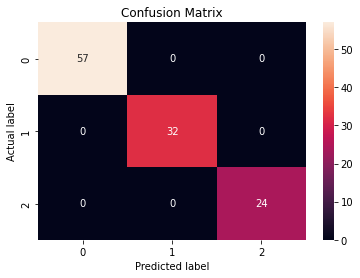

In [66]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming you have a function to get predictions from your model
def get_predictions(model, dataloader):
    model.eval()
    predictions, true_labels = [], []

    for batch in dataloader:
        batch = tuple(t.to(device) for t in batch)
        b_input_ids, b_input_mask, b_labels = batch

        with torch.no_grad():
            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)

        logits = outputs.logits
        logits = logits.detach().cpu().numpy()
        label_ids = b_labels.to('cpu').numpy()

        predictions.append(logits)
        true_labels.append(label_ids)

    return np.concatenate(predictions, axis=0), np.concatenate(true_labels, axis=0)

# Get predictions for the validation set
predictions, true_labels = get_predictions(model, validation_dataloader)
predicted_labels = np.argmax(predictions, axis=1)

print(classification_report(true_labels, predicted_labels))

# Confusion Matrix
cm = confusion_matrix(true_labels, predicted_labels)
sns.heatmap(cm, annot=True, fmt='d')
plt.title('Confusion Matrix')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
plt.show()


In [ ]:
# Import necessary libraries
import torch
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from zenml.steps import step, Output

@step
def evaluate_model_step(model: torch.nn.Module, validation_dataloader: DataLoader, device: str) -> Output(report=str):
    """
    Step to evaluate a BERT model using a validation dataloader, and visualize the results with a confusion matrix.

    Args:
        model (torch.nn.Module): The trained model for evaluation.
        validation_dataloader (DataLoader): DataLoader containing validation data.
        device (str): Device to perform computation on.

    Returns:
        str: Classification report as a string.
    """
    # Function to get predictions from the model
    def get_predictions(model, dataloader):
        model.eval()
        predictions, true_labels = [], []

        for batch in dataloader:
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch

            with torch.no_grad():
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)

            logits = outputs.logits.detach().cpu().numpy()
            label_ids = b_labels.to('cpu').numpy()

            predictions.append(logits)
            true_labels.append(label_ids)

        return np.concatenate(predictions, axis=0), np.concatenate(true_labels, axis=0)

    # Get predictions for the validation set
    predictions, true_labels = get_predictions(model, validation_dataloader)
    predicted_labels = np.argmax(predictions, axis=1)

    # Generate classification report
    report = classification_report(true_labels, predicted_labels)
    print(report)

    # Generate and plot confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title('Confusion Matrix')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

    return report

# Note: Make sure all dependencies (like matplotlib, seaborn, sklearn) are installed in your environment.


In [67]:
import mlflow
import mlflow.pytorch

mlflow.set_tracking_uri("http://localhost:5000/")
mlflow.set_experiment("BERT Stance Detection")
with mlflow.start_run():
    mlflow.log_param("learning_rate", 2e-5)
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("batch_size", train_dataloader.batch_size)

    # Set the seed value all over the place to make this reproducible
    seed_val = 42
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

    # BERT requires a special optimizer and a learning rate scheduler
    optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
    epochs = 10
    total_steps = len(train_dataloader) * epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

    # Function to calculate the accuracy of our predictions vs labels
    def flat_accuracy(preds, labels):
        pred_flat = np.argmax(preds, axis=1).flatten()
        labels_flat = labels.flatten()
        return np.sum(pred_flat == labels_flat) / len(labels_flat)

    # Function for formatting elapsed times
    def format_time(elapsed):
        elapsed_rounded = int(round((elapsed)))
        return str(datetime.timedelta(seconds=elapsed_rounded))

    # Training Loop
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    for epoch_i in range(0, epochs):
        
        # Training
        print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
        print('Training...')

        total_loss = 0
        model.train()

        for step, batch in enumerate(train_dataloader):
            if step % 40 == 0 and not step == 0:
                elapsed = format_time(time.time() - t0)
                print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch

            model.zero_grad()        

            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

        avg_train_loss = total_loss / len(train_dataloader)            
        print("  Average training loss: {0:.2f}".format(avg_train_loss))

        # Validation
        print("\nRunning Validation...")

        model.eval()
        total_eval_accuracy = 0
        total_eval_loss = 0

        for batch in validation_dataloader:
            
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch
            
            with torch.no_grad():        
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)

            loss = outputs.loss
            total_eval_loss += loss.item()
            logits = outputs.logits

            logits = logits.detach().cpu().numpy()
            label_ids = b_labels.to('cpu').numpy()

            total_eval_accuracy += flat_accuracy(logits, label_ids)
        
        # Calculate precision, recall, and F1-score
        predictions, true_labels = get_predictions(model, validation_dataloader) # Assuming get_predictions function
        predicted_labels = np.argmax(predictions, axis=1)
        report = classification_report(true_labels, predicted_labels, output_dict=True)
        
        # Log metrics
        mlflow.log_metric("avg_train_loss", avg_train_loss, step=epoch_i)
        mlflow.log_metric("avg_val_accuracy", avg_val_accuracy, step=epoch_i)
        mlflow.log_metric("avg_val_loss", avg_val_loss, step=epoch_i)

        # Log precision, recall, and F1-score for each class
        for label, metrics in report.items():
            if label not in ["accuracy", "macro avg", "weighted avg"]:
                mlflow.log_metric(f"class_{label}_precision", metrics["precision"], step=epoch_i)
                mlflow.log_metric(f"class_{label}_recall", metrics["recall"], step=epoch_i)
                mlflow.log_metric(f"class_{label}_f1-score", metrics["f1-score"], step=epoch_i)

        avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
        print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

        avg_val_loss = total_eval_loss / len(validation_dataloader)
        print("  Validation Loss: {0:.2f}".format(avg_val_loss))
        mlflow.log_metric("avg_train_loss", avg_train_loss, step=epoch_i)
        mlflow.log_metric("avg_val_accuracy", avg_val_accuracy, step=epoch_i)
        mlflow.log_metric("avg_val_loss", avg_val_loss, step=epoch_i)
        # Log macro and weighted average of precision, recall, and F1-score
        mlflow.log_metric("macro_avg_precision", report["macro avg"]["precision"], step=epoch_i)
        mlflow.log_metric("macro_avg_recall", report["macro avg"]["recall"], step=epoch_i)
        mlflow.log_metric("macro_avg_f1-score", report["macro avg"]["f1-score"], step=epoch_i)

        mlflow.log_metric("weighted_avg_precision", report["weighted avg"]["precision"], step=epoch_i)
        mlflow.log_metric("weighted_avg_recall", report["weighted avg"]["recall"], step=epoch_i)
    mlflow.log_metric("weighted_avg_f1-score", report["weighted avg"]["f1-score"], step=epoch_i)

    print("Training complete!")

2024/04/20 17:47:10 INFO mlflow.tracking.fluent: Experiment with name 'BERT Stance Detection' does not exist. Creating a new experiment.


======== Epoch 1 / 10 ========
Training...
  Average training loss: 0.01

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 2 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 3 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 4 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 5 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 6 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 7 / 10 ========
Training...
  Average training loss: 0.00

Running Validation...
  Accuracy: 1.00
  Validation Loss: 0.00
======== Epoch 8 / 10 ========
Training..

In [ ]:
# Import necessary libraries
import mlflow
import mlflow.pytorch
import torch
import numpy as np
import random
import time
import datetime
from sklearn.metrics import classification_report
from transformers import AdamW, get_linear_schedule_with_warmup
from torch.utils.data import DataLoader
from zenml.steps import step, Output

@step
def train_and_log_with_mlflow_step(train_dataloader: DataLoader, validation_dataloader: DataLoader, model: torch.nn.Module, device: str) -> torch.nn.Module:
    """
    Step to train a model and log training/validation metrics and parameters to MLflow.

    Args:
        train_dataloader (DataLoader): DataLoader for training data.
        validation_dataloader (DataLoader): DataLoader for validation data.
        model (torch.nn.Module): The model to be trained and evaluated.
        device (str): Device to perform computation on.

    Returns:
        torch.nn.Module: The trained model.
    """
    mlflow.set_tracking_uri("http://localhost:5000/")
    mlflow.set_experiment("BERT Stance Detection")

    with mlflow.start_run():
        mlflow.log_param("learning_rate", 2e-5)
        mlflow.log_param("epochs", 10)
        mlflow.log_param("batch_size", train_dataloader.batch_size)

        seed_val = 42
        random.seed(seed_val)
        np.random.seed(seed_val)
        torch.manual_seed(seed_val)
        torch.cuda.manual_seed_all(seed_val)

        optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
        epochs = 10
        total_steps = len(train_dataloader) * epochs
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

        model.to(device)

        def flat_accuracy(preds, labels):
            pred_flat = np.argmax(preds, axis=1).flatten()
            labels_flat = labels.flatten()
            return np.sum(pred_flat == labels_flat) / len(labels_flat)

        def format_time(elapsed):
            return str(datetime.timedelta(seconds=int(round((elapsed)))))

        for epoch_i in range(epochs):
            model.train()
            total_loss = 0
            t0 = time.time()

            for step, batch in enumerate(train_dataloader):
                if step % 40 == 0 and not step == 0:
                    elapsed = format_time(time.time() - t0)
                    print(f'  Batch {step} of {len(train_dataloader)}. Elapsed: {elapsed}.')

                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch

                model.zero_grad()
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
                loss = outputs.loss
                total_loss += loss.item()
                loss.backward()

                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                scheduler.step()

            avg_train_loss = total_loss / len(train_dataloader)
            print(f"Average training loss: {avg_train_loss:.2f}")
            mlflow.log_metric("avg_train_loss", avg_train_loss, step=epoch_i)

            model.eval()
            total_eval_accuracy = 0
            total_eval_loss = 0
            eval_steps = 0

            for batch in validation_dataloader:
                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch

                with torch.no_grad():
                    outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)

                loss = outputs.loss
                total_eval_loss += loss.item()
                logits = outputs.logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()
                total_eval_accuracy += flat_accuracy(logits, label_ids)
                eval_steps += 1

            avg_val_accuracy = total_eval_accuracy / eval_steps
            avg_val_loss = total_eval_loss / eval_steps
            print(f"Validation Accuracy: {avg_val_accuracy:.2f}")
            print(f"Validation Loss: {avg_val_loss:.2f}")
            mlflow.log_metric("avg_val_accuracy", avg_val_accuracy, step=epoch_i)
            mlflow.log_metric("avg_val_loss", avg_val_loss, step=epoch_i)

        print("Training complete!")
        return model

# Make sure MLflow, PyTorch, and all other required packages are installed in your environment.


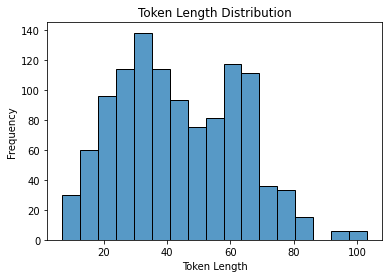

In [68]:
token_lengths = data['tokens'].apply(len)
sns.histplot(token_lengths)
plt.title('Token Length Distribution')
plt.xlabel('Token Length')
plt.ylabel('Frequency')
plt.show()

In [69]:
import numpy as np

# Early stopping parameters
best_val_loss = np.inf
patience = 3  # Number of epochs to tolerate no improvement
patience_counter = 0


In [ ]:
import mlflow
import mlflow.pytorch

mlflow.set_tracking_uri("http://localhost:5000/")
mlflow.set_experiment("BERT Stance Detection")
with mlflow.start_run():
    mlflow.log_param("learning_rate", 2e-5)
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("batch_size", train_dataloader.batch_size)

    # Set the seed value all over the place to make this reproducible
    seed_val = 42
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

    # BERT requires a special optimizer and a learning rate scheduler
    optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
    epochs = 10
    total_steps = len(train_dataloader) * epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

    # Function to calculate the accuracy of our predictions vs labels
    def flat_accuracy(preds, labels):
        pred_flat = np.argmax(preds, axis=1).flatten()
        labels_flat = labels.flatten()
        return np.sum(pred_flat == labels_flat) / len(labels_flat)

    # Function for formatting elapsed times
    def format_time(elapsed):
        elapsed_rounded = int(round((elapsed)))
        return str(datetime.timedelta(seconds=elapsed_rounded))

    # Training Loop
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    for epoch_i in range(0, epochs):
        
        # Training
        print('======== Epoch {:} / {:} ========'.format(epoch_i + 1, epochs))
        print('Training...')

        total_loss = 0
        model.train()

        for step, batch in enumerate(train_dataloader):
            if step % 40 == 0 and not step == 0:
                elapsed = format_time(time.time() - t0)
                print('  Batch {:>5,}  of  {:>5,}.    Elapsed: {:}.'.format(step, len(train_dataloader), elapsed))

            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch

            model.zero_grad()        

            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

        avg_train_loss = total_loss / len(train_dataloader)            
        print("  Average training loss: {0:.2f}".format(avg_train_loss))

        # Validation
        print("\nRunning Validation...")

        model.eval()
        total_eval_accuracy = 0
        total_eval_loss = 0

        for batch in validation_dataloader:
            
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch
            
            with torch.no_grad():        
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)

            loss = outputs.loss
            total_eval_loss += loss.item()
            logits = outputs.logits

            logits = logits.detach().cpu().numpy()
            label_ids = b_labels.to('cpu').numpy()

            total_eval_accuracy += flat_accuracy(logits, label_ids)
        
        # Calculate precision, recall, and F1-score
        predictions, true_labels = get_predictions(model, validation_dataloader) # Assuming get_predictions function
        predicted_labels = np.argmax(predictions, axis=1)
        report = classification_report(true_labels, predicted_labels, output_dict=True)
        
        # Log metrics
        mlflow.log_metric("avg_train_loss", avg_train_loss, step=epoch_i)
        mlflow.log_metric("avg_val_accuracy", avg_val_accuracy, step=epoch_i)
        mlflow.log_metric("avg_val_loss", avg_val_loss, step=epoch_i)

        # Log precision, recall, and F1-score for each class
        for label, metrics in report.items():
            if label not in ["accuracy", "macro avg", "weighted avg"]:
                mlflow.log_metric(f"class_{label}_precision", metrics["precision"], step=epoch_i)
                mlflow.log_metric(f"class_{label}_recall", metrics["recall"], step=epoch_i)
                mlflow.log_metric(f"class_{label}_f1-score", metrics["f1-score"], step=epoch_i)

        avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
        print("  Accuracy: {0:.2f}".format(avg_val_accuracy))

        avg_val_loss = total_eval_loss / len(validation_dataloader)
        print("  Validation Loss: {0:.2f}".format(avg_val_loss))
        mlflow.log_metric("avg_train_loss", avg_train_loss, step=epoch_i)
        mlflow.log_metric("avg_val_accuracy", avg_val_accuracy, step=epoch_i)
        mlflow.log_metric("avg_val_loss", avg_val_loss, step=epoch_i)
        # Log macro and weighted average of precision, recall, and F1-score
        mlflow.log_metric("macro_avg_precision", report["macro avg"]["precision"], step=epoch_i)
        mlflow.log_metric("macro_avg_recall", report["macro avg"]["recall"], step=epoch_i)
        mlflow.log_metric("macro_avg_f1-score", report["macro avg"]["f1-score"], step=epoch_i)

        mlflow.log_metric("weighted_avg_precision", report["weighted avg"]["precision"], step=epoch_i)
        mlflow.log_metric("weighted_avg_recall", report["weighted avg"]["recall"], step=epoch_i)
        mlflow.log_metric("weighted_avg_f1-score", report["weighted avg"]["f1-score"], step=epoch_i)

        # Check for improvement
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0  # reset counter
            print(f"New best model found at epoch {epoch_i+1}")
            
            # Save the best model
            mlflow.pytorch.log_model(model, "model", registered_model_name="BERT-Stance-Detection-Best")
        else:
            patience_counter += 1
            print(f"No improvement in epoch {epoch_i+1}. Early stopping counter: {patience_counter}/{patience}")
            if patience_counter >= patience:
                print("Early stopping triggered.")
                break

    print("Training complete!")

    

In [70]:
import torch
import shutil

best_val_loss = float('inf')
best_model = None
patience = 3
patience_counter = 0


In [82]:
import mlflow
import mlflow.pytorch

mlflow.set_tracking_uri("http://localhost:5000/")
mlflow.set_experiment("BERT Stance Detection")
with mlflow.start_run():
    mlflow.log_param("learning_rate", 2e-5)
    mlflow.log_param("epochs", epochs)
    mlflow.log_param("batch_size", train_dataloader.batch_size)

    # Set the seed value all over the place to make this reproducible
    seed_val = 42
    random.seed(seed_val)
    np.random.seed(seed_val)
    torch.manual_seed(seed_val)
    torch.cuda.manual_seed_all(seed_val)

    # BERT requires a special optimizer and a learning rate scheduler
    optimizer = AdamW(model.parameters(), lr=2e-5, eps=1e-8)
    epochs = 10
    total_steps = len(train_dataloader) * epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

    # Function to calculate the accuracy of our predictions vs labels
    def flat_accuracy(preds, labels):
        pred_flat = np.argmax(preds, axis=1).flatten()
        labels_flat = labels.flatten()
        return np.sum(pred_flat == labels_flat) / len(labels_flat)

    # Function for formatting elapsed times
    def format_time(elapsed):
        elapsed_rounded = int(round((elapsed)))
        return str(datetime.timedelta(seconds=elapsed_rounded))

    # Training Loop
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)

    for epoch_i in range(epochs):
        # Training phase
        model.train()
        total_loss = 0
        for step, batch in enumerate(train_dataloader):
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch

            model.zero_grad()        
            outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()
            scheduler.step()

        avg_train_loss = total_loss / len(train_dataloader)
        mlflow.log_metric("train_loss", avg_train_loss, step=epoch_i)

        # Validation phase
        model.eval()
        total_eval_loss = 0
        total_eval_accuracy = 0
        for batch in validation_dataloader:
            batch = tuple(t.to(device) for t in batch)
            b_input_ids, b_input_mask, b_labels = batch
            
            with torch.no_grad():
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
            
            loss = outputs.loss
            total_eval_loss += loss.item()
            logits = outputs.logits
            logits = logits.detach().cpu().numpy()
            label_ids = b_labels.to('cpu').numpy()
            total_eval_accuracy += flat_accuracy(logits, label_ids)

        avg_val_loss = total_eval_loss / len(validation_dataloader)
        avg_val_accuracy = total_eval_accuracy / len(validation_dataloader)
        mlflow.log_metric("val_loss", avg_val_loss, step=epoch_i)
        mlflow.log_metric("val_accuracy", avg_val_accuracy, step=epoch_i)

        # Check if this is the best model based on validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            best_model = model.state_dict()
            patience_counter = 0  # Reset patience counter
            print(f"New best model found at epoch {epoch_i+1}")
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered after {patience} epochs with no improvement")
                break

    # Save the best model to MLflow
    mlflow.pytorch.log_model(model, "model", registered_model_name="Best BERT Model")

    

New best model found at epoch 1
New best model found at epoch 2


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:51                                                                                   │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\_tensor.py:522 in │
│ backward                                                                                         │
│                                                                                                  │
│    519 │   │   │   │   create_graph=create_graph,                                                │
│    520 │   │   │   │   inputs=inputs,                                                            │
│    521 │   │   │   )                                                                             │
│ ❱  522 │   │   torch.autograd.backward(                                                          │
│    523 │   │   │   self, gradient, retain_graph, create_graph, inputs=inputs                     │
│    524 │   │   )                                                                                 │
│    525                                                                                           │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\autograd\__init__ │
│ .py:266 in backward                                                                              │
│                                                                                                  │
│   263 │   # The reason we repeat the same comment below is that                                  │
│   264 │   # some Python versions print out the first line of a multi-line function               │
│   265 │   # calls in the traceback and some print out the last line                              │
│ ❱ 266 │   Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the bac   │
│   267 │   │   tensors,                                                                           │
│   268 │   │   grad_tensors_,                                                                     │
│   269 │   │   retain_graph,                                                                      │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
KeyboardInterrupt

In [83]:
from scipy.stats import uniform, randint

# Example hyperparameter space
hyperparameter_space = {
    'learning_rate': uniform(1e-5, 5e-5),
    'batch_size': randint(16, 64),
    'epochs': randint(2, 5)
}


In [167]:
from transformers import AdamW, get_linear_schedule_with_warmup
import torch

def random_search(model, param_space, num_iterations, data_loader, validation_loader, device):
    best_score = 0
    best_params = {}

    for iteration in range(num_iterations):
        # Randomly sample parameters
        params = {key: val.rvs() for key, val in param_space.items()}
        print(f"Iteration {iteration + 1}, using parameters: {params}")

        # Update model with sampled hyperparameters
        optimizer = AdamW(model.parameters(), lr=params['learning_rate'], eps=1e-8)
        total_steps = len(data_loader) * params['epochs']
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

        for epoch in range(params['epochs']):
            # Training loop
            model.train()
            total_loss = 0
            for step, batch in enumerate(data_loader):
                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch
                model.zero_grad()        
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
                loss = outputs.loss
                total_loss += loss.item()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                scheduler.step()

            # Validation loop
            model.eval()
            total_eval_accuracy = 0
            for batch in validation_loader:
                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch
                with torch.no_grad():        
                    outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)
                logits = outputs.logits
                logits = logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()
                total_eval_accuracy += flat_accuracy(logits, label_ids)

            avg_val_accuracy = total_eval_accuracy / len(validation_loader)

        # Calculate the evaluation metric (accuracy here)
        eval_metric = avg_val_accuracy

        # Update best score and parameters
        if eval_metric > best_score:
            best_score = eval_metric
            best_params = params

    return best_params, best_score

# Function to calculate the accuracy of our predictions vs labels
def flat_accuracy(preds, labels):
    pred_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return np.sum(pred_flat == labels_flat) / len(labels_flat)


In [79]:
# Import necessary libraries
from transformers import AdamW, get_linear_schedule_with_warmup
import torch
import numpy as np
from zenml.steps import step, Output
from scipy.stats import loguniform, randint

@step
def hyperparameter_tuning_step(model: torch.nn.Module, data_loader: torch.utils.data.DataLoader, validation_loader: torch.utils.data.DataLoader, device: str, num_iterations: int) -> Output(best_params=dict, best_score=float):
    """
    Step to perform random search hyperparameter tuning on a model.

    Args:
        model (torch.nn.Module): The model to tune.
        data_loader (DataLoader): DataLoader for training data.
        validation_loader (DataLoader): DataLoader for validation data.
        device (str): Device to perform computation on.
        num_iterations (int): Number of iterations for random search.

    Returns:
        dict: Best hyperparameter set found.
        float: Best evaluation metric score.
    """
    # Define the hyperparameter space
    param_space = {
        'learning_rate': loguniform(1e-6, 1e-4),
        'epochs': randint(2, 10)
    }

    best_score = 0
    best_params = {}

    # Function to calculate the accuracy of predictions vs labels
    def flat_accuracy(preds, labels):
        pred_flat = np.argmax(preds, axis=1).flatten()
        labels_flat = labels.flatten()
        return np.sum(pred_flat == labels_flat) / len(labels_flat)

    for iteration in range(num_iterations):
        # Randomly sample parameters
        params = {key: val.rvs() for key, val in param_space.items()}
        print(f"Iteration {iteration + 1}, using parameters: {params}")

        # Update model with sampled hyperparameters
        optimizer = AdamW(model.parameters(), lr=params['learning_rate'], eps=1e-8)
        total_steps = len(data_loader) * params['epochs']
        scheduler = get_linear_schedule_with_warmup(optimizer, num_warmup_steps=0, num_training_steps=total_steps)

        for epoch in range(params['epochs']):
            # Training loop
            model.train()
            total_loss = 0
            for step, batch in enumerate(data_loader):
                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch

                model.zero_grad()
                outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask, labels=b_labels)
                loss = outputs.loss
                total_loss += loss.item()
                loss.backward()
                torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
                optimizer.step()
                scheduler.step()

            # Validation loop
            model.eval()
            total_eval_accuracy = 0
            for batch in validation_loader:
                batch = tuple(t.to(device) for t in batch)
                b_input_ids, b_input_mask, b_labels = batch

                with torch.no_grad():
                    outputs = model(b_input_ids, token_type_ids=None, attention_mask=b_input_mask)
                logits = outputs.logits.detach().cpu().numpy()
                label_ids = b_labels.to('cpu').numpy()
                total_eval_accuracy += flat_accuracy(logits, label_ids)

            avg_val_accuracy = total_eval_accuracy / len(validation_loader)

        # Update best score and parameters if the current score is higher
        if avg_val_accuracy > best_score:
            best_score = avg_val_accuracy
            best_params = params

    return best_params, best_score

# Ensure that all necessary packages, including scipy for distributions and any necessary model and data utilities, are installed.


The @step decorator that you used to define your hyperparameter_tuning_step step is deprecated. Check out the 0.40.0 migration guide for more information on how to migrate your steps to the new syntax: https://docs.zenml.io/reference/migration-guide/migration-zero-forty
Using the Output class to define the outputs of your steps is deprecated. You should instead use the standard Python way of type annotating your functions. Check out our documentation https://docs.zenml.io/user-guide/advanced-guide/pipelining-features/configure-steps-pipelines#step-output-names for more information on how to assign custom names to your step outputs.


In [55]:
%pip install nest_asyncio


Note: you may need to restart the kernel to use updated packages.


The easiest way to find your model's URI is through the MLflow Web UI, where models and their versions are listed:

Access the MLflow Web UI: Usually available at http://localhost:5000 if you're running MLflow locally, or at another address if you've configured it differently or are using a hosted version.
Navigate to the 'Models' Tab: If you've registered your model using mlflow.pytorch.log_model with a registered_model_name, it will appear under the "Models" tab.
Find Your Model: Click on the name of the registered model to see all versions.
Model URI: For each version, you'll see information including the source run and the location. The URI can be something like models:/<model-name>/<version> or models:/<model-name>/Production.

If you haven't registered your model but have logged it during a specific MLflow run, you can retrieve the model URI using the run ID:

Find the Run ID: Look at the output when you run your model training script, or use the MLflow UI to find the specific run.
Construct the Model URI: Use the run ID to construct the URI in the format runs:/<run_id>/<artifact_path>, where <artifact_path> is the path you specified when logging the model.

In [84]:
import mlflow

# Set the tracking URI if necessary
mlflow.set_tracking_uri("http://localhost:5000/")

# Get a list of all registered models
client = mlflow.tracking.MlflowClient()
for rm in client.list_registered_models():
    print(f"Registered Model Name: {rm.name}")
    for version in rm.latest_versions:
        print(f"Version: {version.version}, Stage: {version.current_stage}, URI: {version.source}")


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:8                                                                                    │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
AttributeError: 'MlflowClient' object has no attribute 'list_registered_models'

In [98]:
import nest_asyncio
nest_asyncio.apply()

# Now you can include the rest of your FastAPI setup and execution in the same Jupyter cell
from fastapi import FastAPI
from pydantic import BaseModel
from transformers import BertTokenizer, BertForSequenceClassification
import torch

app = FastAPI()
# Load the model using MLflow
#model_uri = "models:/Best BERT Model/Production"
#model = mlflow.pytorch.load_model(model_uri)
#model.eval()  # Make sure the model is in evaluation mode if not already set

model_name = "C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden"
tokenizer = BertTokenizer.from_pretrained(model_name)
model = BertForSequenceClassification.from_pretrained(model_name)
model.eval()

# Define the request body schema
class InputText(BaseModel):
    text: str

# Define the API endpoint
@app.post("/predict")
async def predict(input_text: InputText):
    # Tokenize the input text
    inputs = tokenizer.encode_plus(
        input_text.text,
        add_special_tokens=True,
        max_length=512,  # typical max length for BERT
        padding='max_length',
        truncation=True,
        return_tensors="pt"
    )

    # Make the prediction
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        predicted_class_id = torch.argmax(logits, dim=1).item()

    return {"predicted_class": predicted_class_id}

if __name__ == "__main__":
    import uvicorn
    uvicorn.run(app, host="0.0.0.0", port=8000)



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


INFO:     Started server process [18616]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://0.0.0.0:8000 (Press CTRL+C to quit)


INFO:     127.0.0.1:16751 - "GET / HTTP/1.1" 404 Not Found
INFO:     127.0.0.1:16751 - "GET /github-markdown-css HTTP/1.1" 404 Not Found
INFO:     127.0.0.1:16751 - "GET /docs HTTP/1.1" 200 OK
INFO:     127.0.0.1:16751 - "GET /openapi.json HTTP/1.1" 200 OK
INFO:     127.0.0.1:16751 - "GET /github-markdown-css HTTP/1.1" 404 Not Found


INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [18616]


╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:54                                                                                   │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\uvicorn\main.py:575 in  │
│ run                                                                                              │
│                                                                                                  │
│   572 │   │   sock = config.bind_socket()                                                        │
│   573 │   │   Multiprocess(config, target=server.run, sockets=[sock]).run()                      │
│   574 │   else:                                                                                  │
│ ❱ 575 │   │   server.run()                                                                       │
│   576 │   if config.uds and os.path.exists(config.uds):                                          │
│   577 │   │   os.remove(config.uds)  # pragma: py-win32                                          │
│   578                                                                                            │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\uvicorn\server.py:65 in │
│ run                                                                                              │
│                                                                                                  │
│    62 │                                                                                          │
│    63 │   def run(self, sockets: list[socket.socket] | None = None) -> None:                     │
│    64 │   │   self.config.setup_event_loop()                                                     │
│ ❱  65 │   │   return asyncio.run(self.serve(sockets=sockets))                                    │
│    66 │                                                                                          │
│    67 │   async def serve(self, sockets: list[socket.socket] | None = None) -> None:             │
│    68 │   │   with self.capture_signals():                                                       │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\nest_asyncio.py:32 in   │
│ run                                                                                              │
│                                                                                                  │
│    29 │   def run(future, *, debug=False):                                                       │
│    30 │   │   loop = asyncio.get_event_loop()                                                    │
│    31 │   │   loop.set_debug(debug)                                                              │
│ ❱  32 │   │   return loop.run_until_complete(future)                                             │
│    33 │                                                                                          │
│    34 │   if sys.version_info >= (3, 6, 0):                                                      │
│    35 │   │   asyncio.Task = asyncio.tasks._CTask = asyncio.tasks.Task = \                       │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\nest_asyncio.py:92 in   │
│ run_until_complete                                                                               │
│                                                                                                  │
│    89 │   │   │   if f is not future:                      

In [ ]:
# Import necessary libraries
from zenml.steps import step
from transformers import BertTokenizer, BertForSequenceClassification
import torch

@step
def setup_fastapi_step(model_name: str) -> FastAPI:
    """
    Step to configure a FastAPI app with a pre-trained BERT model for sequence classification.

    Args:
        model_name (str): Path to the BERT model directory.

    Returns:
        FastAPI: Configured FastAPI application.
    """
    from fastapi import FastAPI, HTTPException
    from pydantic import BaseModel

    # Initialize FastAPI app
    app = FastAPI()

    # Load model and tokenizer
    tokenizer = BertTokenizer.from_pretrained(model_name)
    model = BertForSequenceClassification.from_pretrained(model_name)
    model.eval()  # Set model to evaluation mode

    # Define Pydantic model for input validation
    class InputText(BaseModel):
        text: str

    # Define prediction endpoint
    @app.post("/predict")
    async def predict(input_text: InputText):
        if not input_text.text:
            raise HTTPException(status_code=400, detail="Text field cannot be empty")
        inputs = tokenizer(input_text.text, return_tensors="pt", padding=True, truncation=True)
        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits
            predicted_class_index = torch.argmax(logits, dim=1).item()
            return {"predicted_class": class_names[predicted_class_index]}  # Assuming class_names is defined

    return app

# Note: Ensure all dependencies (FastAPI, transformers, pydantic, torch) are installed.


curl -X POST http://localhost:8000/predict -H "Content-Type: application/json" -d "{\"text\":\"We love Trump\"}"

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
import random
import mlflow.pytorch

app = FastAPI()

# Load models using MLflow or directly
model_a = mlflow.pytorch.load_model("models:/ModelA/Production")
model_b = mlflow.pytorch.load_model("models:/ModelB/Production")

# Define the request body schema
class InputText(BaseModel):
    text: str

# Define the API endpoint
@app.post("/predict")
def predict(input_text: InputText):
    # Randomly route traffic to model A or model B
    if random.random() < 0.5:  # 50% chance for each model
        model = model_a
        model_version = 'A'
    else:
        model = model_b
        model_version = 'B'
    
    # Process the request using the selected model
    prediction = model.predict(input_text.text)
    
    # Log the prediction, model version, and any other relevant metrics
    log_prediction(input_text.text, prediction, model_version)
    
    # Return the result with model version info
    return {"model_version": model_version, "prediction": prediction}

def log_prediction(text, prediction, model_version):
    # Implement logging logic here
    # This could be writing to a file, a database, or any other storage
    print(f"Model {model_version} processed text: {text} with prediction: {prediction}")


Class 0 (Precision: 0.60, Recall: 0.82, F1-Score: 0.69)

Precision: 60% of the instances predicted as class 0 are correct.
Recall: The model correctly identifies 82% of the actual class 0 instances.
F1-Score: The balance between precision and recall for class 0 is represented by an F1-score of 0.69, which is relatively high and indicates a good balance, albeit with a slightly higher emphasis on recall.

Class 1 (Precision: 0.82, Recall: 0.82, F1-Score: 0.82)

This class shows high and balanced precision and recall, both at 82%.
The F1-score of 0.82 indicates a very good balance between precision and recall, suggesting that the model performs effectively for this class.

Class 2 (Precision: 0.83, Recall: 0.62, F1-Score: 0.71)

Precision: 83% precision indicates a high likelihood that predictions for class 2 are correct.
Recall: The recall of 62% is the lowest among the classes but still respectable, suggesting that some class 2 instances are missed.
F1-Score: An F1-score of 0.71 shows a good balance between precision and recall, leaning more towards precision.

Overall Performance

Accuracy: The overall accuracy of 74% shows that the model correctly predicts the class of an instance 74% of the time across all classes.
Macro Average: The macro average for precision, recall, and F1-score are all 0.75. This indicates a balanced performance across all classes without bias towards any particular class.
Weighted Average: The weighted average for precision, recall, and F1-score are slightly higher at 0.76, considering the support (number of instances) for each class. This suggests a slightly better performance for the classes with more instances.
Interpretation and Insights
The model shows a well-balanced performance across all classes, with particularly strong results in class 1.
While the model performs well in precision for class 2, it could benefit from improvements in recall, indicating it might be missing some class 2 instances.
The balanced macro and weighted averages suggest that the model is overall effective and doesn't suffer from significant bias towards any class.
Further improvements might still be possible, particularly in increasing the recall for class 2 and balancing the precision-recall trade-off for class 0.

#Another Training Process with other hyperparameters and other parameters in general

In [ ]:
from transformers import BertTokenizer
from torch.utils.data import TensorDataset

In [ ]:
data['data_type'] = ['not_set'] * data.shape[0]
data.head()

,text,label,tokens,data_type
tweet_id,,,,
1298098337946783745,"@USER @USER and like you, they are all squish #gop weasels who will be in tears on election night.",0,"[101, 1030, 5310, 1030, 5310, 1998, 2066, 2017, 1010, 2027, 2024, 2035, 5490, 27020, 2232, 1001, 2175, 2361, 29268, 2015, 2040, 2097, 2022, 1999, 4000, 2006, 2602, 2305, 1012, 102]",not_set
1296643755022397440,.@USER on covid-19: we'll put the politics aside. we'll take the muzzle off the experts so the the public gets the information they need and deserve. honest unvarnished truth. they can handle it. #demconvention @USER HTTP,1,"[101, 1012, 1030, 5310, 2006, 2522, 17258, 1011, 2539, 1024, 2057, 1005, 2222, 2404, 1996, 4331, 4998, 1012, 2057, 1005, 2222, 2202, 1996, 17750, 2125, 1996, 8519, 2061, 1996, 1996, 2270, 4152, 1996, 2592, 2027, 2342, 1998, 10107, 1012, 7481, 4895, 10755, 28357, 3606, 1012, 2027, 2064, 5047, 2009, 1012, 1001, 17183, 8663, 15338, 3258, 1030, 5310, 8299, 102]",not_set
1293907151501459462,"@USER google: how to vote early in ""your state"" and get it done as soon as possible. we have a duty to help the u.s. postal service process these ballots and reduce the stress donald trump is intentionally placing on these public servants. \n\n#voteearly #voteblue #bidenharris2020",1,"[101, 1030, 5310, 8224, 1024, 2129, 2000, 3789, 2220, 1999, 1000, 2115, 2110, 1000, 1998, 2131, 2009, 2589, 2004, 2574, 2004, 2825, 1012, 2057, 2031, 1037, 4611, 2000, 2393, 1996, 1057, 1012, 1055, 1012, 10690, 2326, 2832, 2122, 17069, 1998, 5547, 1996, 6911, 6221, 8398, 2003, 15734, 6885, 2006, 2122, 2270, 8858, 1012, 1001, 3789, 14644, 2135, 1001, 3789, 16558, 5657, 1001, 7226, 2368, 8167, 6935, 11387, 11387, 102]",not_set
1239356229803225088,am i the only one that pictures biden this way all the time? #demdebate HTTP,0,"[101, 2572, 1045, 1996, 2069, 2028, 2008, 4620, 7226, 2368, 2023, 2126, 2035, 1996, 2051, 1029, 1001, 17183, 3207, 20179, 8299, 102]",not_set
1298801129984266241,@USER was it the infanticide lie the nun dropped on us that was helpful?\n#rnc2020,0,"[101, 1030, 5310, 2001, 2009, 1996, 10527, 21752, 4682, 1996, 16634, 3333, 2006, 2149, 2008, 2001, 14044, 1029, 1001, 29300, 2278, 11387, 11387, 102]",not_set


In [ ]:
X_train, X_val, y_train, y_val = train_test_split(data.index.values, data.label.values,test_size = 0.15,random_state = 17,stratify = data.label.values)

In [ ]:
data.loc[X_train, 'data_type'] = 'train'
data.loc[X_val, 'data_type'] = 'val'

In [ ]:
data.groupby(['label', 'data_type']).count()

text  tokens
label data_type              
0     train       133     133
      val          24      24
1     train        95      95
      val          17      17
2     train        90      90
      val          16      16

In [ ]:
#Tokenize train set
encoded_data_train = tokenizer.batch_encode_plus(data[data.data_type == 'train'].text.values,
                                                add_special_tokens = True,
                                                return_attention_mask = True,
                                                pad_to_max_length = True,
                                                max_length = 150,
                                                return_tensors = 'pt')

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


In [ ]:
#Tokenizer val set
encoded_data_val = tokenizer.batch_encode_plus(data[data.data_type == 'val'].text.values,
                                                #add_special_tokens = True,
                                                return_attention_mask = True,
                                                pad_to_max_length = True,
                                                max_length = 150,
                                                return_tensors = 'pt')

In [ ]:
encoded_data_train

{'input_ids': tensor([[ 101, 1030, 5310,  ...,    0,    0,    0],
        [ 101, 1012, 1030,  ...,    0,    0,    0],
        [ 101, 2572, 1045,  ...,    0,    0,    0],
        ...,
        [ 101, 2065, 2057,  ...,    0,    0,    0],
        [ 101, 1045, 2066,  ...,    0,    0,    0],
        [ 101, 1030, 5310,  ...,    0,    0,    0]]), 'token_type_ids': tensor([[0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        ...,
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0],
        [0, 0, 0,  ..., 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])}

In [ ]:
#Encode train set
input_ids_train = encoded_data_train['input_ids']
attention_masks_train = encoded_data_train['attention_mask']
labels_train = torch.tensor(data[data.data_type == 'train'].label.values)

In [ ]:
#Encode val set
input_ids_val = encoded_data_val['input_ids']
attention_masks_val = encoded_data_val['attention_mask']

#Convert data type to torch.tensor
labels_val = torch.tensor(data[data.data_type == 'val'].label.values)

In [ ]:
input_ids_train

tensor([[ 101, 1030, 5310,  ...,    0,    0,    0],
        [ 101, 1012, 1030,  ...,    0,    0,    0],
        [ 101, 2572, 1045,  ...,    0,    0,    0],
        ...,
        [ 101, 2065, 2057,  ...,    0,    0,    0],
        [ 101, 1045, 2066,  ...,    0,    0,    0],
        [ 101, 1030, 5310,  ...,    0,    0,    0]])

In [ ]:
attention_masks_train


tensor([[1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        ...,
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0],
        [1, 1, 1,  ..., 0, 0, 0]])

In [ ]:
labels_train

tensor([0, 1, 0, 2, 0, 0, 1, 0, 2, 1, 2, 2, 2, 0, 0, 1, 2, 2, 1, 2, 1, 2, 0, 2,
        0, 2, 2, 0, 0, 1, 0, 0, 2, 1, 0, 0, 1, 1, 0, 2, 0, 1, 2, 0, 0, 1, 2, 0,
        2, 1, 0, 1, 1, 0, 1, 2, 2, 0, 2, 0, 1, 1, 1, 2, 1, 1, 2, 0, 2, 1, 0, 2,
        0, 1, 0, 2, 0, 1, 0, 2, 2, 2, 0, 2, 2, 0, 1, 2, 1, 1, 0, 0, 2, 0, 0, 1,
        0, 1, 1, 1, 2, 2, 1, 2, 1, 0, 1, 2, 1, 1, 0, 0, 0, 0, 0, 2, 0, 2, 1, 1,
        0, 0, 1, 0, 1, 0, 1, 0, 1, 2, 0, 2, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 2, 2,
        1, 0, 0, 0, 0, 0, 1, 0, 2, 2, 0, 0, 0, 1, 2, 0, 1, 1, 0, 0, 0, 2, 2, 0,
        2, 0, 2, 0, 2, 1, 1, 0, 0, 0, 2, 1, 0, 2, 2, 0, 2, 1, 0, 2, 1, 1, 0, 0,
        1, 2, 1, 0, 0, 1, 2, 2, 2, 1, 1, 0, 0, 1, 1, 0, 0, 2, 1, 0, 2, 2, 0, 2,
        0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 2, 2, 1, 1, 2, 0, 0,
        1, 2, 1, 0, 0, 1, 2, 0, 0, 0, 0, 0, 2, 2, 2, 0, 1, 1, 2, 0, 1, 2, 0, 0,
        0, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 1, 2, 0, 2, 1, 0, 1, 1, 0, 1, 0, 1,
        2, 0, 0, 0, 2, 0, 2, 2, 0, 2, 1,

In [ ]:
#Create dataloader
dataset_train = TensorDataset(input_ids_train, 
                              attention_masks_train,
                              labels_train)

dataset_val = TensorDataset(input_ids_val, 
                             attention_masks_val, 
                             labels_val)

In [ ]:
print(len(dataset_train))
print(len(dataset_val))

318
57


In [ ]:
model = BertForSequenceClassification.from_pretrained(PRETRAINED_LM_PATH, num_labels=3, ignore_mismatched_sizes=True)
model.config

BertConfig {
  "_name_or_path": "C:\\Users\\LENOVO\\Desktop\\bert-election2020-twitter-stance-biden",
  "architectures": [
    "BertForSequenceClassification"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "id2label": {
    "0": "LABEL_0",
    "1": "LABEL_1",
    "2": "LABEL_2"
  },
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "label2id": {
    "LABEL_0": 0,
    "LABEL_1": 1,
    "LABEL_2": 2
  },
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "torch_dtype": "float32",
  "transformers_version": "4.38.2",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30722
}

In [ ]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler

batch_size = 4 #Since we have limited resource

#Load train set
dataloader_train = DataLoader(dataset_train,sampler = RandomSampler(dataset_train),batch_size = batch_size)

#Load val set
dataloader_val = DataLoader(dataset_val,sampler = RandomSampler(dataset_val),batch_size = 32) #since we don't have to do backpropagation for this step

In [ ]:
from transformers import AdamW, get_linear_schedule_with_warmup
epochs = 10

#Load optimizer
optimizer = AdamW(model.parameters(),lr = 1e-5,eps = 1e-8) #2e-5 > 5e-5

In [ ]:
#Load scheduler
scheduler = get_linear_schedule_with_warmup(optimizer,num_warmup_steps = 0,num_training_steps = len(dataloader_train)*epochs)

In [ ]:
import numpy as np
from sklearn.metrics import f1_score

#F1 score
def f1_score_func(preds, labels):
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    return f1_score(labels_flat, preds_flat, average = 'weighted')

In [ ]:
#Accuracy score
def accuracy_per_class(preds, labels):
    label_dict_inverse = {v: k for k, v in label_dict.items()}
    
    #Make prediction
    preds_flat = np.argmax(preds, axis=1).flatten()
    labels_flat = labels.flatten()
    
    for label in np.unique(labels_flat):
        y_preds = preds_flat[labels_flat==label]
        y_true = labels_flat[labels_flat==label]
        print(f'Class: {label_dict_inverse[label]}')
        print(f'Accuracy:{len(y_preds[y_preds==label])}/{len(y_true)}\n')

In [ ]:
def evaluate(dataloader_val):

    #Evaluation mode disables the dropout layer 
    model.eval()
    
    #Tracking variables
    loss_val_total = 0
    predictions, true_vals = [], []
    
    for batch in tqdm(dataloader_val):
        
        #Load into GPU
        batch = tuple(b.to(device) for b in batch)
        
        #Define inputs
        inputs = {'input_ids':      batch[0],
                  'attention_mask': batch[1],
                  'labels':         batch[2]}

        #Compute logits
        with torch.no_grad():        
            outputs = model(**inputs)
        
        #Compute loss
        loss = outputs[0]
        logits = outputs[1]
        loss_val_total += loss.item()

        #Compute accuracy
        logits = logits.detach().cpu().numpy()
        label_ids = inputs['labels'].cpu().numpy()
        predictions.append(logits)
        true_vals.append(label_ids)
    
    #Compute average loss
    loss_val_avg = loss_val_total/len(dataloader_val) 
    
    predictions = np.concatenate(predictions, axis=0)
    true_vals = np.concatenate(true_vals, axis=0)
            
    return loss_val_avg, predictions, true_vals

In [ ]:
import random

seed_val = 17
random.seed(seed_val)
np.random.seed(seed_val)
torch.manual_seed(seed_val)
torch.cuda.manual_seed_all(seed_val)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
print(device)

cpu


In [ ]:
from tqdm.notebook import tqdm
for epoch in tqdm(range(1, epochs+1)):

    #Set model in train mode
    model.train()

    #Tracking variable
    loss_train_total = 0
    
    #Set up progress bar
    progress_bar = tqdm(dataloader_train, 
                        desc='Epoch {:1d}'.format(epoch), 
                        leave=False, 
                        disable=False)
    
    for batch in progress_bar:
        #Set gradient to 0
        model.zero_grad()

        #load into GPU
        batch = tuple(b.to(device) for b in batch)

        #define inputs
        inputs = {'input_ids': batch[0],
                  'attention_mask': batch[1],
                  'labels': batch[2]}
        
        outputs = model(**inputs)
        loss = outputs[0] #output.loss
        loss_train_total +=loss.item()

        #Backward pass to get gradients
        loss.backward()
        
        #Clip the norm of the gradients to 1.0 to prevent exploding gradients
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        
        #Update optimizer
        optimizer.step()

        #Update scheduler
        scheduler.step()
        
        progress_bar.set_postfix({'training_loss': '{:.3f}'.format(loss.item()/len(batch))})     
    
    tqdm.write('\nEpoch {epoch}')
    
    #Print training result
    loss_train_avg = loss_train_total/len(dataloader_train)
    tqdm.write(f'Training loss: {loss_train_avg}')
    
    #Evaluate
    val_loss, predictions, true_vals = evaluate(dataloader_val)
    #F1 score
    val_f1 = f1_score_func(predictions, true_vals)
    tqdm.write(f'Validation loss: {val_loss}')
    tqdm.write(f'F1 Score (weighted): {val_f1}')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.9696608632802963


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.5666688978672028
F1 Score (weighted): 0.7894736842105263


Epoch 2:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.654443123191595


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.5616437941789627
F1 Score (weighted): 0.7487461787846896


Epoch 3:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.5593753306195139


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.5146887898445129
F1 Score (weighted): 0.7855474453501671


Epoch 4:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.4058077627792954


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.4769679456949234
F1 Score (weighted): 0.8236044657097289


Epoch 5:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.3326746561797336


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.517719179391861
F1 Score (weighted): 0.8226652489810383


Epoch 6:   0%|          | 0/80 [00:00<?, ?it/s]


Epoch {epoch}
Training loss: 0.26701633711345496


  0%|          | 0/2 [00:00<?, ?it/s]

Validation loss: 0.7225965559482574
F1 Score (weighted): 0.7448029747198722


Epoch 7:   0%|          | 0/80 [00:00<?, ?it/s]

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:28                                                                                   │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1511 in _wrapped_call_impl                                                                   │
│                                                                                                  │
│   1508 │   │   if self._compiled_call_impl is not None:                                          │
│   1509 │   │   │   return self._compiled_call_impl(*args, **kwargs)  # type: ignore[misc]        │
│   1510 │   │   else:                                                                             │
│ ❱ 1511 │   │   │   return self._call_impl(*args, **kwargs)                                       │
│   1512 │                                                                                         │
│   1513 │   def _call_impl(self, *args, **kwargs):                                                │
│   1514 │   │   forward_call = (self._slow_forward if torch._C._get_tracing_state() else self.fo  │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1520 in _call_impl                                                                           │
│                                                                                                  │
│   1517 │   │   if not (self._backward_hooks or self._backward_pre_hooks or self._forward_hooks   │
│   1518 │   │   │   │   or _global_backward_pre_hooks or _global_backward_hooks                   │
│   1519 │   │   │   │   or _global_forward_hooks or _global_forward_pre_hooks):                   │
│ ❱ 1520 │   │   │   return forward_call(*args, **kwargs)                                          │
│   1521 │   │                                                                                     │
│   1522 │   │   try:                                                                              │
│   1523 │   │   │   result = None                                                                 │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\models\ber │
│ t\modeling_bert.py:1564 in forward                                                               │
│                                                                                                  │
│   1561 │   │   """                                                                               │
│   1562 │   │   return_dict = return_dict if return_dict is not None else self.config.use_return  │
│   1563 │   │                                                                                     │
│ ❱ 1564 │   │   outputs = self.bert(                                                              │
│   1565 │   │   │   input_ids,                                                                    │
│   1566 │   │   │   attention_mask=attention_mask,                                                │
│   1567 │   │   │   token_type_ids=token_type_ids,                                                │
│                                                                                                  │
│ c:\Users\LENOVO\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\module │
│ .py:1511 in _wrapped_call_impl                                                                   │
│                                                                                                  │
│   1508 │   │   if self._compiled_call_impl is not None:    

In [ ]:
outputs.loss

tensor(0.0096, grad_fn=<NllLossBackward0>)

In [ ]:
outputs.logits

tensor([[-2.0184,  3.8596, -1.9231],
        [-1.0758, -2.0951,  3.5465]], grad_fn=<AddmmBackward0>)

In [ ]:
#Evaluate
_, predictions, true_vals = evaluate(dataloader_val)

100%|██████████| 2/2 [00:17<00:00,  8.58s/it]


In [ ]:
#Get accuracy score
accuracy_per_class(predictions, true_vals)

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>:2                                                                                    │
│                                                                                                  │
│   1 #Get accuracy score                                                                          │
│ ❱ 2 accuracy_per_class(predictions, true_vals)                                                   │
│   3                                                                                              │
│                                                                                                  │
│ in accuracy_per_class:3                                                                          │
│                                                                                                  │
│    1 #Accuracy score                                                                             │
│    2 def accuracy_per_class(preds, labels):                                                      │
│ ❱  3 │   label_dict_inverse = {v: k for k, v in label_dict.items()}                              │
│    4 │                                                                                           │
│    5 │   #Make prediction                                                                        │
│    6 │   preds_flat = np.argmax(preds, axis=1).flatten()                                         │
╰──────────────────────────────────────────────────────────────────────────────────────────────────╯
NameError: name 'label_dict' is not defined